In [1]:
###Importing the Libraries

In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import warnings
warnings.filterwarnings("ignore")
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
import plotly.graph_objs as go
import matplotlib as mpl
import matplotlib.patches as mpatches
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from plotly import tools
from plotly.subplots import make_subplots
from plotly.offline import iplot

In [3]:
##LOADING THE DATASET

In [4]:
df=pd.read_csv('BankChurners.csv')

In [5]:
df.head() 

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [6]:
##TARGET VARIABLE

In [7]:
df.Attrition_Flag.value_counts()

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

In [8]:
###BASIC ANALYSIS###

In [9]:
##SHAPE OF THE DATASET

In [10]:
df.shape

(10127, 23)

In [11]:
##DROPPING COLUMNS #First column and last two column

In [12]:
df=df.iloc[: , 1:-2]

In [13]:
##SHAPE OF THE DATASET #After dropping

In [14]:
df.shape

(10127, 20)

In [15]:
##DIMENSIONS OF THE DATASET 

In [16]:
df.ndim

2

In [17]:
##SIZE OF THE DATASET 

In [18]:
df.size

202540

In [19]:
##COLUMNS OF THE DATASET

In [20]:
df.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [21]:
##DATATYPES OF THE DATASET

In [22]:
df.dtypes

Attrition_Flag               object
Customer_Age                  int64
Gender                       object
Dependent_count               int64
Education_Level              object
Marital_Status               object
Income_Category              object
Card_Category                object
Months_on_book                int64
Total_Relationship_Count      int64
Months_Inactive_12_mon        int64
Contacts_Count_12_mon         int64
Credit_Limit                float64
Total_Revolving_Bal           int64
Avg_Open_To_Buy             float64
Total_Amt_Chng_Q4_Q1        float64
Total_Trans_Amt               int64
Total_Trans_Ct                int64
Total_Ct_Chng_Q4_Q1         float64
Avg_Utilization_Ratio       float64
dtype: object

In [23]:
##INFORMATION OF THE DATASET #Shows the Null Value

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [25]:
##FINDING THE DUPLICATES IN THE DATASET

In [26]:
df[df.duplicated()]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio


In [27]:
###EXPLORATORY DATA ANALYSIS###

In [28]:
##DESCRIBE THE DATASET 

In [29]:
#Statistics on Categorical Data

In [30]:
round(df.describe(exclude = 'object'),2)

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00,10127.00
mean,46.33,2.35,35.93,3.81,2.34,2.46,8631.95,1162.81,7469.14,0.76,4404.09,64.86,0.71,0.27
std,8.02,1.30,7.99,1.55,1.01,1.11,9088.78,814.99,9090.69,0.22,3397.13,23.47,0.24,0.28
min,26.00,0.00,13.00,1.00,0.00,0.00,1438.30,0.00,3.00,0.00,510.00,10.00,0.00,0.00
25%,41.00,1.00,31.00,3.00,2.00,2.00,2555.00,359.00,1324.50,0.63,2155.50,45.00,0.58,0.02
50%,46.00,2.00,36.00,4.00,2.00,2.00,4549.00,1276.00,3474.00,0.74,3899.00,67.00,0.70,0.18
75%,52.00,3.00,40.00,5.00,3.00,3.00,11067.50,1784.00,9859.00,0.86,4741.00,81.00,0.82,0.50
max,73.00,5.00,56.00,6.00,6.00,6.00,34516.00,2517.00,34516.00,3.40,18484.00,139.00,3.71,1.00


In [31]:
#Statistics on Numerical Data

In [32]:
round(df.describe(exclude = ['float', 'int64']),2)

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
count,10127,10127,10127,10127,10127,10127
unique,2,2,7,4,6,4
top,Existing Customer,F,Graduate,Married,Less than $40K,Blue
freq,8500,5358,3128,4687,3561,9436


In [33]:
###PREPROCESSING THE DATASET###

In [34]:
##CHANGING THE ATTRITION FLAG TO O AND 1

In [35]:
df["Attrition_Flag"] = df["Attrition_Flag"].map({"Existing Customer":0, "Attrited Customer":1})

In [36]:
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [37]:
##FINDING THE OUTLIERS

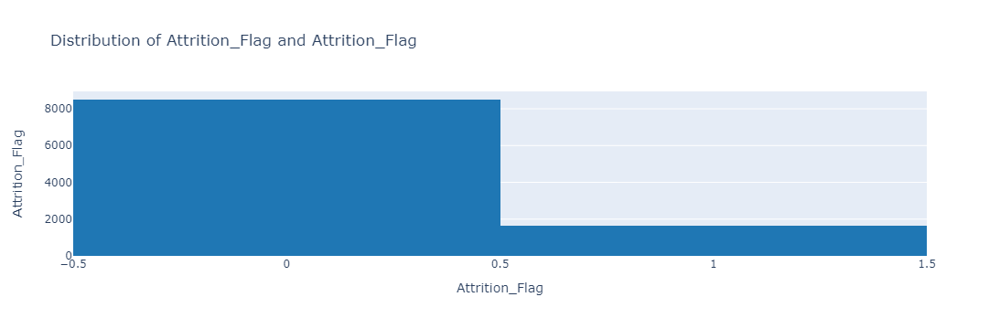

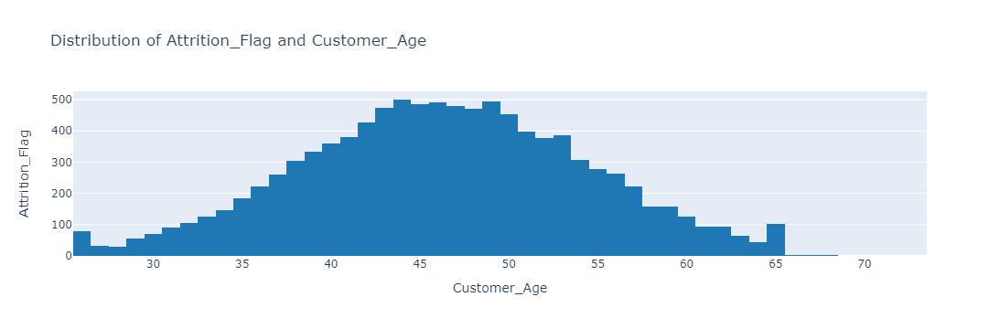

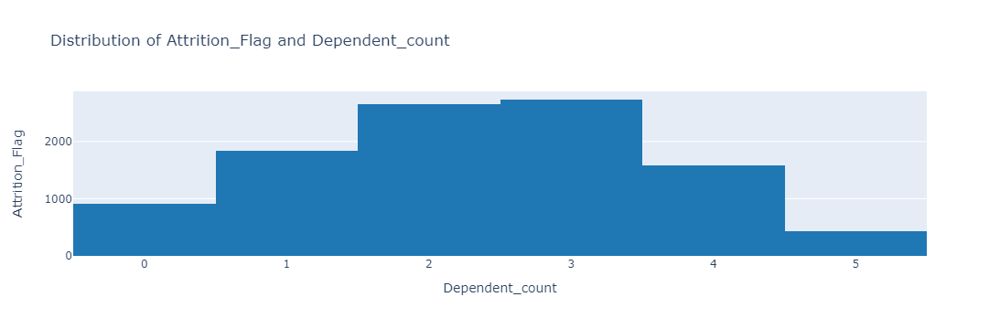

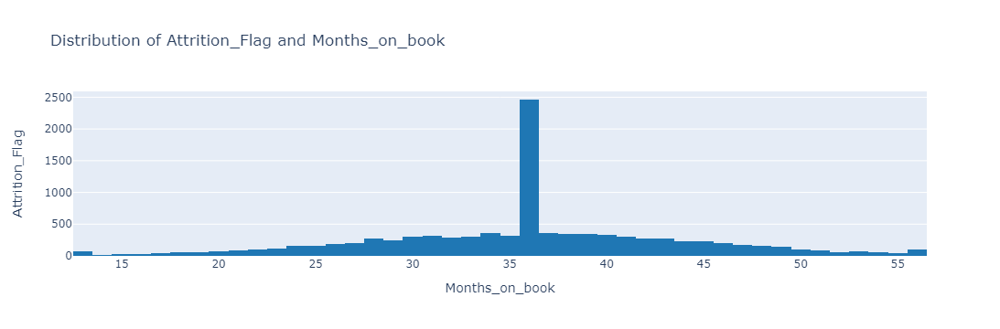

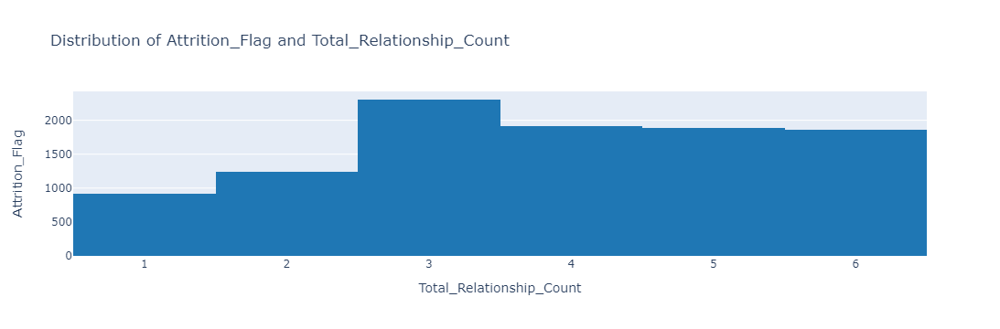

...

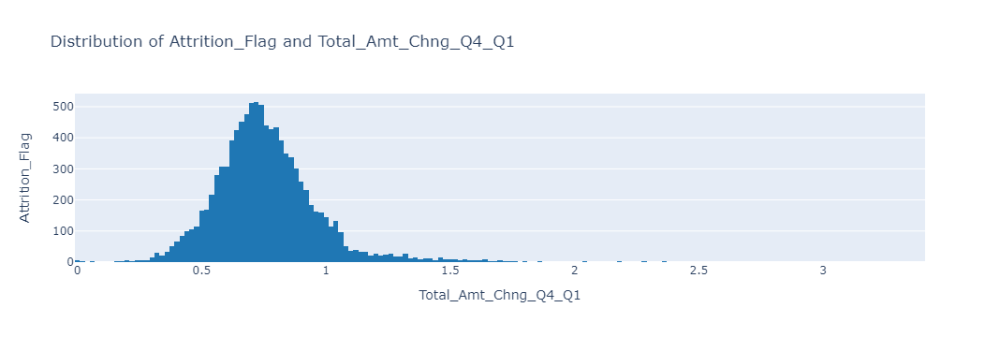

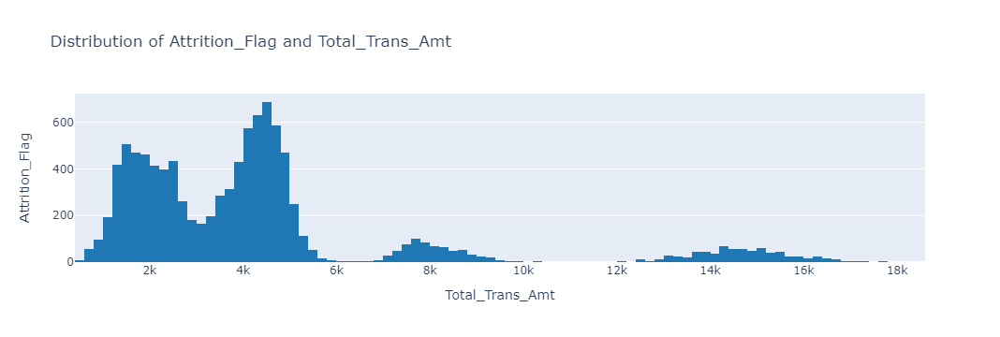

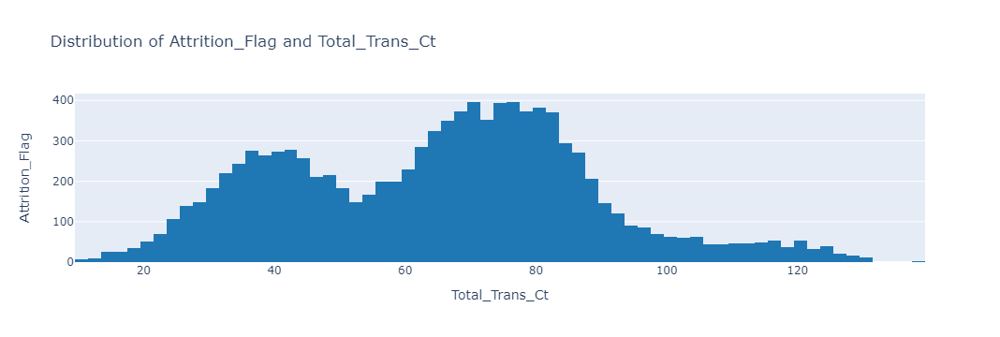

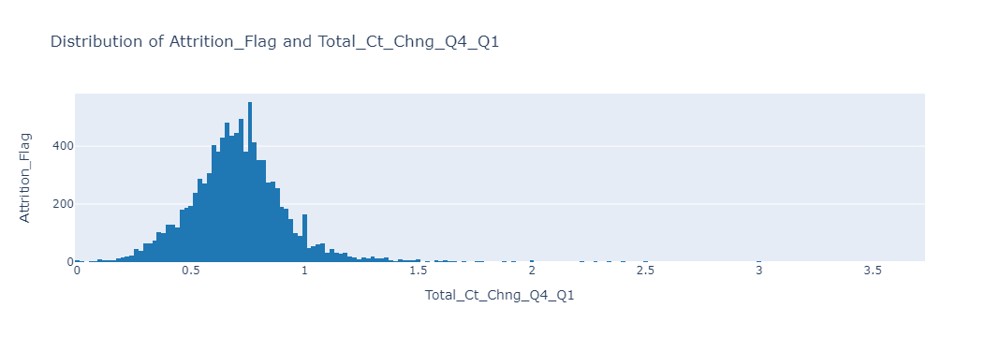

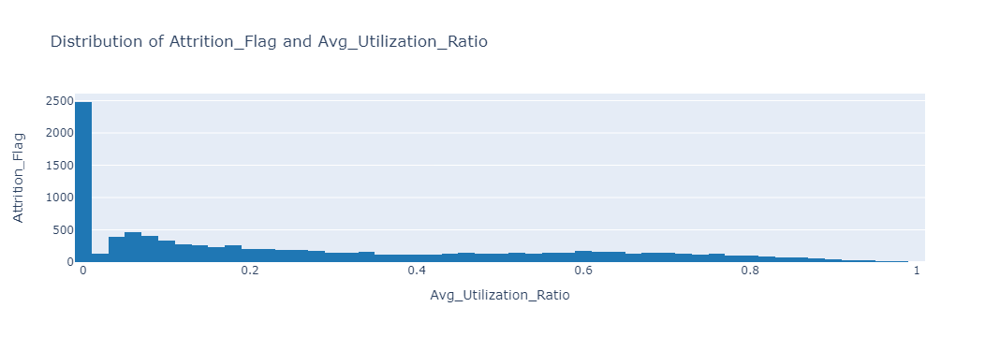

Skewness: 1.848449
Kurtosis: 1.417043


In [38]:
import plotly.express as px

continuous_feature = [feature for feature in df.columns if df[feature].dtype != 'object']
Colors = ['#1f77b4']

for feature in continuous_feature:
    fig = px.histogram(df, x=feature, title='Distribution of Attrition_Flag and ' + feature,
                       color_discrete_sequence=Colors)
    fig.update_yaxes(title_text='Attrition_Flag') 
    fig.show()

print("Skewness: %f" % df['Attrition_Flag'].skew())
print("Kurtosis: %f" % df['Attrition_Flag'].kurt())


In [39]:
###NUMERICAL DATA

In [40]:
###EDA & VISUALIZATION ON NUMERICAL VARIABLES

In [41]:
##LIST OF NUMERICAL VARIABLE

In [42]:
numerical_features = [feature for feature in df.columns if df[feature].dtypes != '0']

print('Number of numerical variables: ',len(numerical_features))
print('\n')
print('Numerical Variables Column: ' ,numerical_features)
print('\n')

Number of numerical variables:  20


Numerical Variables Column:  ['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']




In [43]:
df[numerical_features].head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [44]:
##ANALYSIS OF Attrition_Flag

In [45]:
from IPython.core.display import HTML

def multi_table(table_list, title=''):
    '''Accepts a list of IpyTable objects and returns a table which contains each IpyTable in a cell'''
    html_table = '<table><tr style="background-color: white;"><th colspan="2">{}</th></tr>'.format(title)
    
    for table in table_list:
        table_html = table._repr_html_()
        table_html = table_html.replace('<th>', '<th style="display:none;">')
        html_table += '<tr><td>' + table_html + '</td></tr>'
    
    html_table += '</table>'
    
    return HTML(html_table)

df_nunique = {'Attrition_Flag': pd.DataFrame(df['Attrition_Flag'].value_counts())}
multi_table([df_nunique['Attrition_Flag']], title='Attrition_Flag')

In [46]:
##BAR GRAPH OF Attrition_Flag

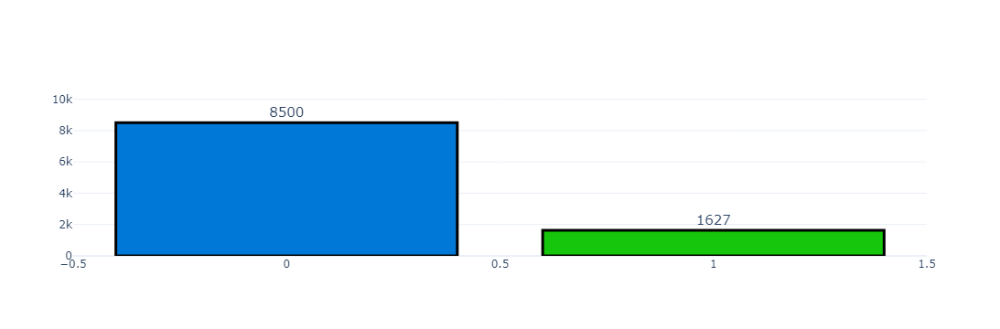

In [47]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import iplot

Colors = ['#0078d7', '#16c60c', '#f03a17', '#00f8d7', '#f0f87f']

fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Bar(
    y=df['Attrition_Flag'].value_counts().values.tolist(),
    x=df['Attrition_Flag'].value_counts().index,
    text=df['Attrition_Flag'].value_counts().values.tolist(),
    textfont=dict(size=15),
    textposition='outside',
    showlegend=False,
    marker=dict(color=Colors,
                line_color='black',
                line_width=3)
), row=1, col=1)

fig.update_layout(title={'y': 0.9,
                         'x': 0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')

fig.update_yaxes(range=[0, 10500])

iplot(fig)


In [48]:
##ANALYSIS OF Customer_Age

In [49]:
df_nunique = {var: pd.DataFrame(df[var].value_counts())
              for var in {'Customer_Age'}}
result = pd.concat(df_nunique.values(), axis=1)
print(result)

              count
Customer_Age       
44              500
49              495
46              490
45              486
47              479
43              473
48              472
50              452
42              426
51              398
53              387
41              379
52              376
40              361
39              333
54              307
38              303
55              279
56              262
37              260
57              223
36              221
35              184
59              157
58              157
34              146
33              127
60              127
32              106
65              101
61               93
62               93
31               91
26               78
30               70
63               65
29               56
64               43
27               32
28               29
67                4
66                2
68                2
70                1
73                1


In [50]:
##SEPERATING THE CUSTOMER AGE BY BINNING

In [51]:
df['Age']=0
df.loc[(df['Customer_Age']>25)&(df['Customer_Age']<=35),'Age']=0
df.loc[(df['Customer_Age']>35)&(df['Customer_Age']<=45),'Age']=1
df.loc[(df['Customer_Age']>45)&(df['Customer_Age']<=55),'Age']=2
df.loc[(df['Customer_Age']>55)&(df['Customer_Age']<=65),'Age']=3
df.loc[df['Customer_Age']>65,'Age']=4
df['Age']=df['Age'].astype(int)

In [52]:
df.drop(['Customer_Age'], axis=1, inplace=True)

In [53]:
df_nunique = {var: pd.DataFrame(df['Age'].value_counts()) 
              for var in {'Age'}}
multi_table([df_nunique['Age']])


In [54]:
##BAR GRAPH OF Customer_Age

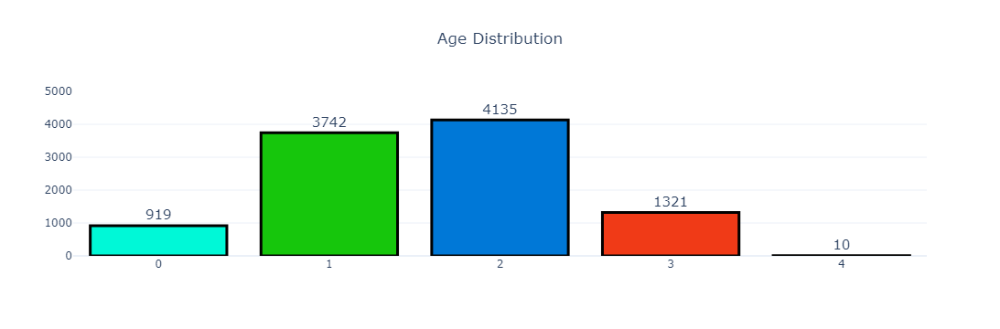

In [55]:
fig = make_subplots(rows=1, cols=1)
Colors = ['#0078d7', '#16c60c', '#f03a17', '#00f8d7', '#f0f87f']
fig.add_trace(go.Bar(y=df['Age'].value_counts().values.tolist(),
                     x=df['Age'].value_counts().index,
                     text=df['Age'].value_counts().values.tolist(),
                     textfont=dict(size=15),
                     textposition='outside',
                     showlegend=False,
                     marker=dict(color=Colors,
                                 line_color='black',
                                 line_width=3)),
              row=1, col=1)

fig.update_layout(title={'text': 'Age Distribution',
                         'y': 0.9,
                         'x': 0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')

fig.update_yaxes(range=[0, 5000])
iplot(fig)


In [56]:
##HISTOGRAM OF Attrition_Flag & Age

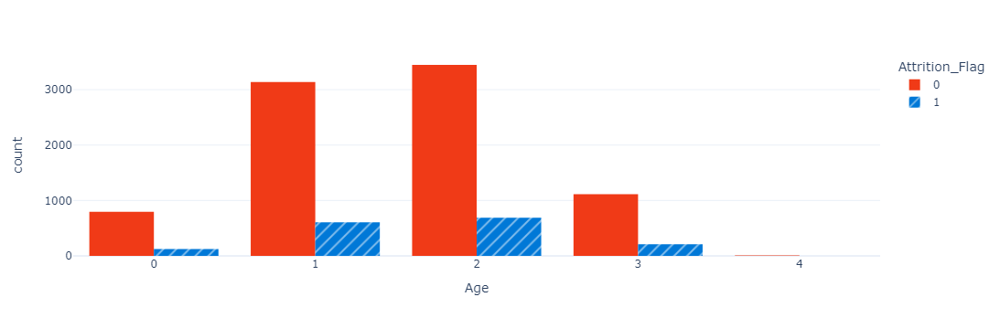

In [57]:
fig = px.histogram(df, x="Age", color = "Attrition_Flag", pattern_shape="Attrition_Flag",
                   template='plotly_white', barmode='group', color_discrete_sequence={
                       0: "#f03a17",
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [58]:
##ANALYSIS OF THE Dependent_Count

In [59]:
df_nunique = {var: pd.DataFrame(df['Dependent_count'].value_counts())
              for var in {'Dependent_count'}}
multi_table([df_nunique['Dependent_count']])

In [60]:
##BAR GRAPH OF Dependent_Count

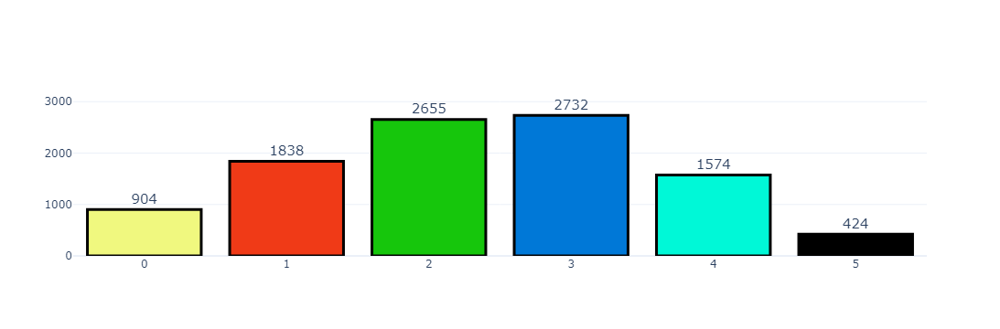

In [61]:
fig = make_subplots(rows=1, cols=1)
Colors = ['#0078d7', '#16c60c', '#f03a17', '#00f8d7', '#f0f87f']
fig.add_trace(go.Bar(y=df['Dependent_count'].value_counts().values.tolist(),
                     x=df['Dependent_count'].value_counts().index,
                     text=df['Dependent_count'].value_counts().values.tolist(),
                     textfont=dict(size=15),
                     textposition='outside',
                     showlegend=False,
                     marker=dict(color=Colors,
                                 line_color='black',
                                 line_width=3)),
              row=1, col=1)

fig.update_layout(title={'y': 0.9,
                         'x': 0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')

fig.update_yaxes(range=[0, 3200])
iplot(fig)


In [62]:
##HISTOGRAM OF Attrition_Flag & Dependent_Count

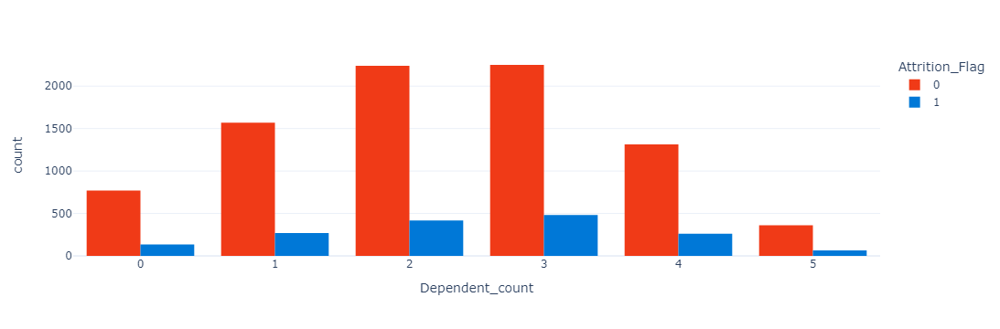

In [63]:
fig = px.histogram(df, x="Dependent_count", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()


In [64]:
##ANALYSIS OF Months_on_book

In [65]:
df_nunique = {var: pd.DataFrame(df['Months_on_book'].value_counts()) 
              for var in {'Months_on_book'}}
multi_table([df_nunique['Months_on_book']])


In [66]:
##SEPERATING THE BANK RELATIONSHIP PERIOD BY BINNING

In [67]:
df['Bank_Relationship_Period'] = 0
df.loc[(df['Months_on_book'] >= 0) & (df['Months_on_book'] <= 10), 'Bank_Relationship_Period'] = 0
df.loc[(df['Months_on_book'] > 10) & (df['Months_on_book'] <= 20), 'Bank_Relationship_Period'] = 1
df.loc[(df['Months_on_book'] > 20) & (df['Months_on_book'] <= 30), 'Bank_Relationship_Period'] = 2
df.loc[(df['Months_on_book'] > 30) & (df['Months_on_book'] <= 40), 'Bank_Relationship_Period'] = 3
df.loc[df['Months_on_book'] > 40, 'Bank_Relationship_Period'] = 4


In [68]:
df['Bank_Relationship_Period'] = df['Bank_Relationship_Period'].astype(int)

In [69]:
df_nunique = {var: pd.DataFrame(df['Bank_Relationship_Period'].value_counts()) 
              for var in {'Bank_Relationship_Period'}}

for var, df_counts in df_nunique.items():
    print("Value counts for", var)
    print(df_counts)

Value counts for Bank_Relationship_Period
                          count
Bank_Relationship_Period       
3                          5424
4                          2483
2                          1837
1                           383


In [70]:
##BAR GRAPH OF Bank_Relationship_Period

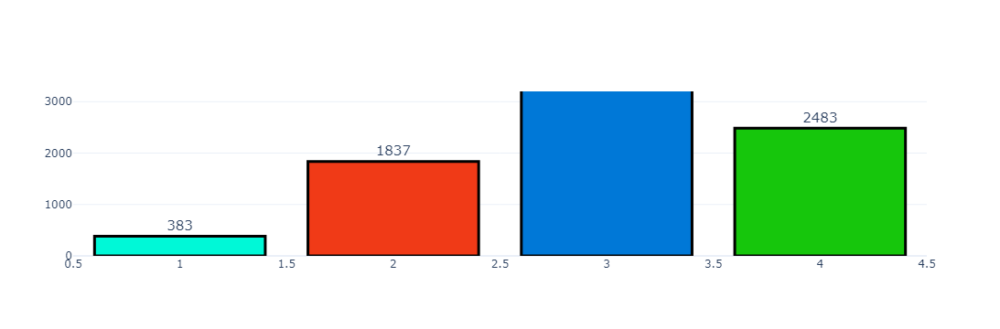

In [71]:
fig = make_subplots(rows=1, cols=1)
Colors = ['#0078d7', '#16c60c', '#f03a17', '#00f8d7', '#f0f87f']
fig.add_trace(go.Bar(y=df['Bank_Relationship_Period'].value_counts().values.tolist(),
                     x=df['Bank_Relationship_Period'].value_counts().index,
                     text=df['Bank_Relationship_Period'].value_counts().values.tolist(),
                     textfont=dict(size=15),
                     textposition='outside',
                     showlegend=False,
                     marker=dict(color=Colors,
                                 line_color='black',
                                 line_width=3)),
              row=1, col=1)

fig.update_layout(title={'y': 0.9,
                         'x': 0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')

fig.update_yaxes(range=[0, 3200])
iplot(fig)

In [72]:
##HISTOGRAM OF Attrition_Flag & Bank_Relationship_Period

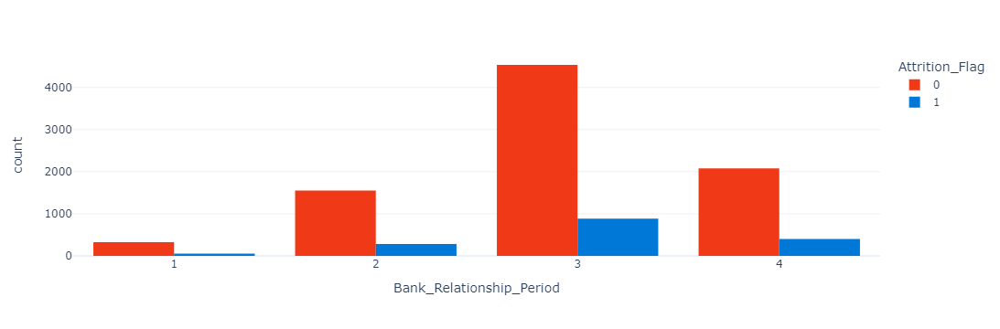

In [73]:
fig = px.histogram(df, x="Bank_Relationship_Period", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [74]:
##ANALYSIS OF Total_Relationship_Count

In [75]:
df_nunique = {var: pd.DataFrame(df['Total_Relationship_Count'].value_counts())
              for var in {'Total_Relationship_Count'}}
multi_table([df_nunique['Total_Relationship_Count']])

In [76]:
##BAR GRAPH OF Total_Relationship_Count

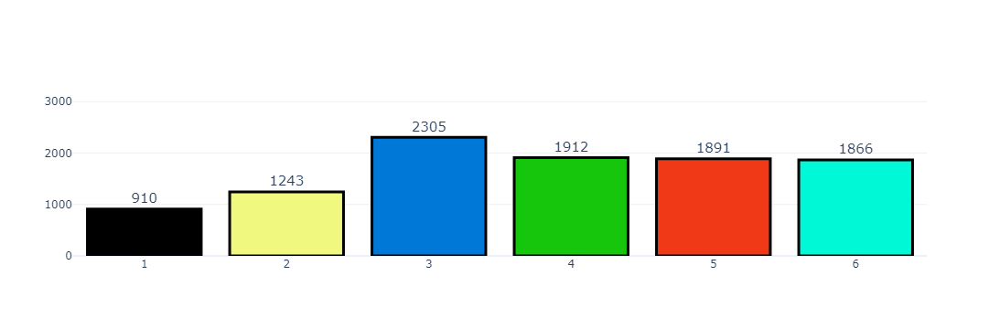

In [77]:
fig = make_subplots(rows=1, cols=1)
Colors = ['#0078d7', '#16c60c', '#f03a17', '#00f8d7', '#f0f87f']
fig.add_trace(go.Bar(y=df['Total_Relationship_Count'].value_counts().values.tolist(),
                     x=df['Total_Relationship_Count'].value_counts().index,
                     text=df['Total_Relationship_Count'].value_counts().values.tolist(),
                     textfont=dict(size=15),
                     textposition='outside',
                     showlegend=False,
                     marker=dict(color=Colors,
                                 line_color='black',
                                 line_width=3)),
              row=1, col=1)

fig.update_layout(title={'y': 0.9,
                         'x': 0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')

fig.update_yaxes(range=[0, 3200])
iplot(fig)

In [78]:
##HISTOGRAM OF Attrition_Flag & Total_Relationship_Count

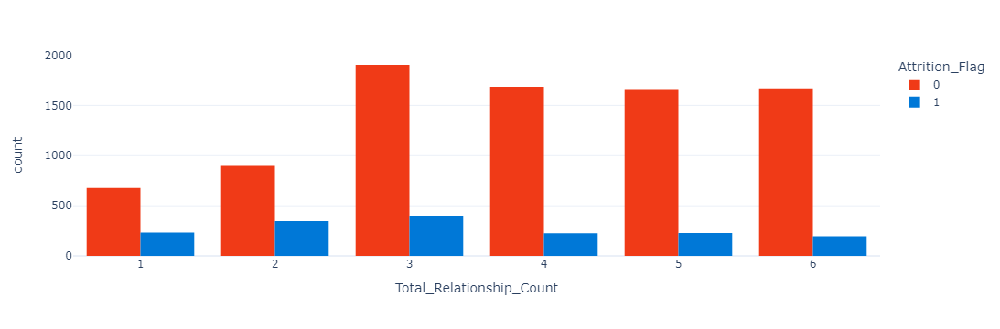

In [79]:
fig = px.histogram(df, x="Total_Relationship_Count", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [80]:
##ANALYSIS OF Months_Inactive_12_mon

In [81]:
df_nunique = {var: pd.DataFrame(df['Months_Inactive_12_mon'].value_counts())
              for var in {'Months_Inactive_12_mon'}}
multi_table([df_nunique['Months_Inactive_12_mon']])

In [82]:
##BAR GRAPH OF Months_Inactive_12_mon

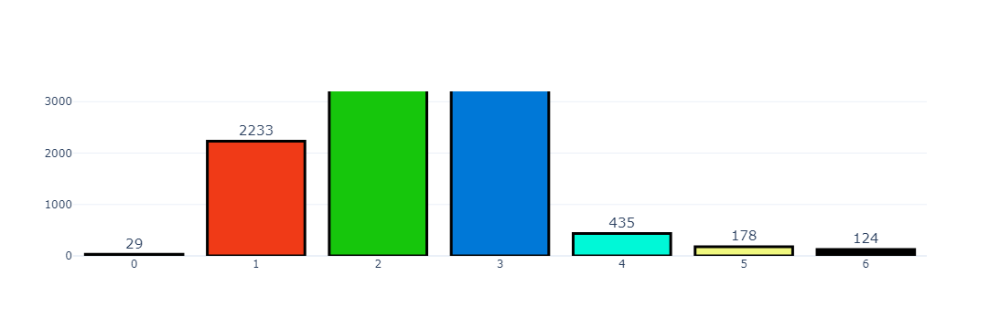

In [83]:
fig = make_subplots(rows=1, cols=1)
Colors = ['#0078d7', '#16c60c', '#f03a17', '#00f8d7', '#f0f87f']
fig.add_trace(go.Bar(y=df['Months_Inactive_12_mon'].value_counts().values.tolist(),
                     x=df['Months_Inactive_12_mon'].value_counts().index,
                     text=df['Months_Inactive_12_mon'].value_counts().values.tolist(),
                     textfont=dict(size=15),
                     textposition='outside',
                     showlegend=False,
                     marker=dict(color=Colors,
                                 line_color='black',
                                 line_width=3)),
              row=1, col=1)

fig.update_layout(title={'y': 0.9,
                         'x': 0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')

fig.update_yaxes(range=[0, 3200])
iplot(fig)

In [84]:
##HISTOGRAM OF Attrition_Flag & Months_Inactive_12_mon

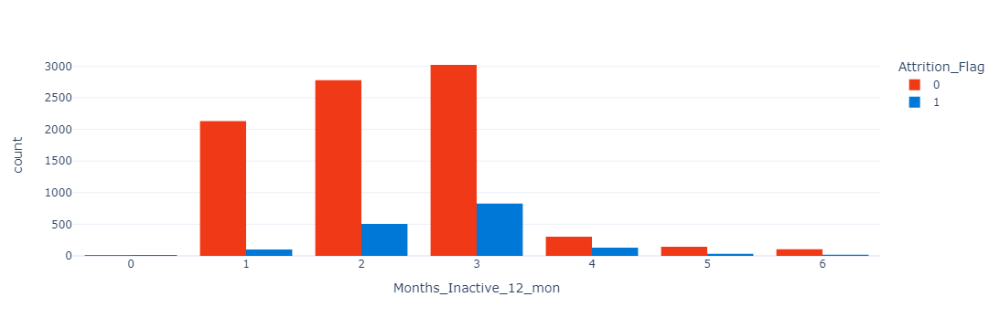

In [85]:
fig = px.histogram(df, x="Months_Inactive_12_mon", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [86]:
##ANALYSIS OF Contacts_Count_12_mon

In [87]:
df_nunique = {var: pd.DataFrame(df['Contacts_Count_12_mon'].value_counts())
              for var in {'Contacts_Count_12_mon'}}
multi_table([df_nunique['Contacts_Count_12_mon']])

In [88]:
##BAR GRAPH OF Contacts_Count_12_mon

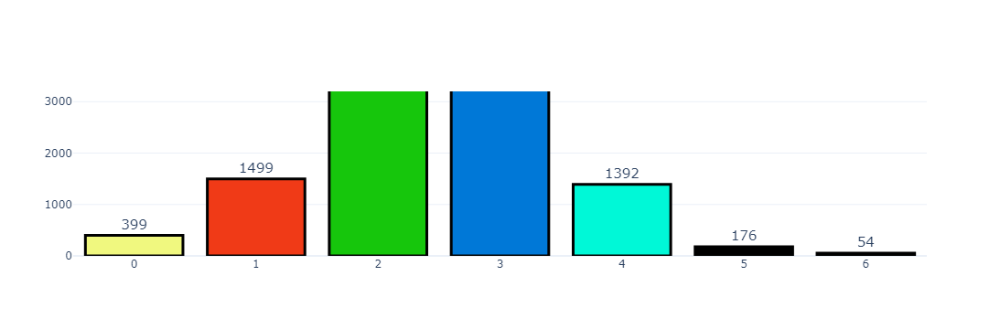

In [89]:
fig = make_subplots(rows=1, cols=1)
Colors = ['#0078d7', '#16c60c', '#f03a17', '#00f8d7', '#f0f87f']
fig.add_trace(go.Bar(y=df['Contacts_Count_12_mon'].value_counts().values.tolist(),
                     x=df['Contacts_Count_12_mon'].value_counts().index,
                     text=df['Contacts_Count_12_mon'].value_counts().values.tolist(),
                     textfont=dict(size=15),
                     textposition='outside',
                     showlegend=False,
                     marker=dict(color=Colors,
                                 line_color='black',
                                 line_width=3)),
              row=1, col=1)

fig.update_layout(title={'y': 0.9,
                         'x': 0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')

fig.update_yaxes(range=[0, 3200])
iplot(fig)

In [90]:
##HISTOGRAM OF Attrition_Flag & Contacts_Count_12_mon

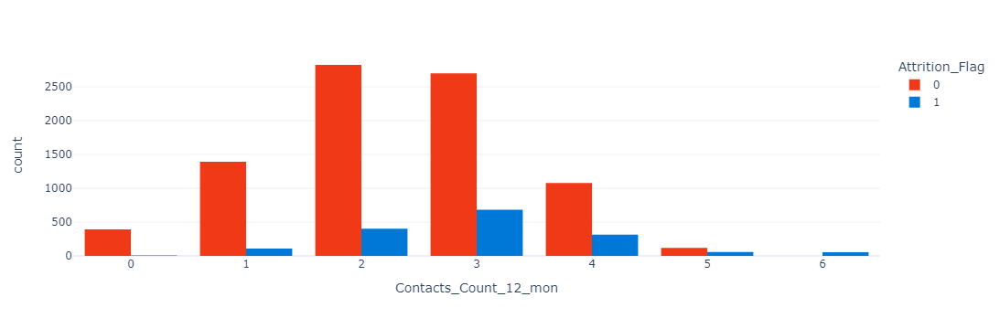

In [91]:
fig = px.histogram(df, x="Contacts_Count_12_mon", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [92]:
##ANALYSIS OF Credit_Limit

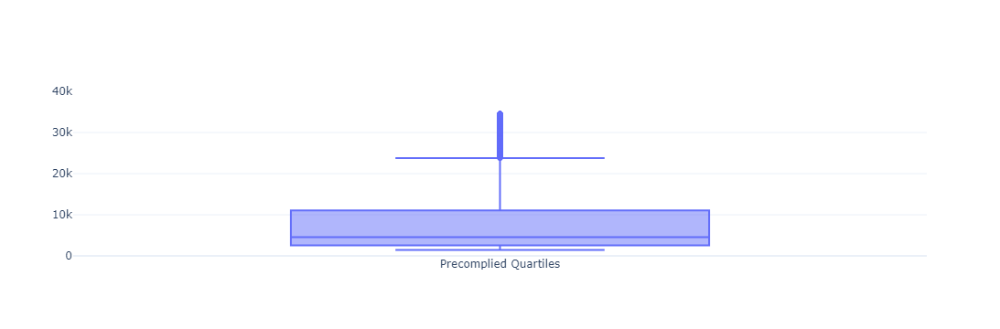

In [93]:
fig = make_subplots(rows=1,cols=1)

fig.add_trace(go.Box(y=df['Credit_Limit']
                     , name="Precomplied Quartiles"))

fig.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
fig.update_yaxes(range=[0,40000])

iplot(fig)

In [94]:
##HISTOGRAM OF Credit_Limit

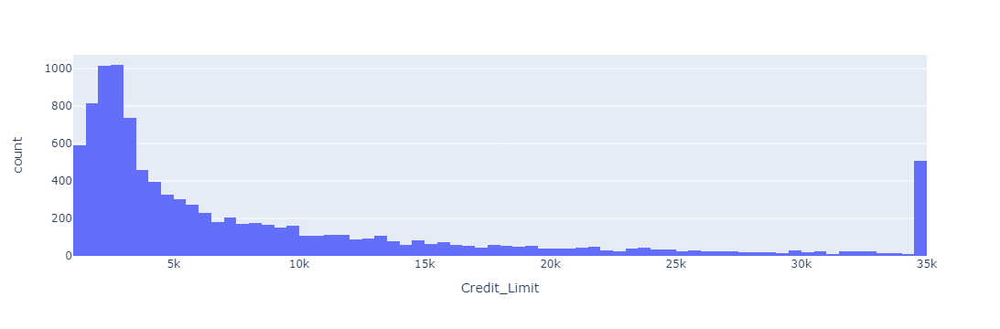

In [95]:
fig = px.histogram(df, x="Credit_Limit")
fig.show()

In [96]:
##ANALYSIS OF Total_Revolving_Bal

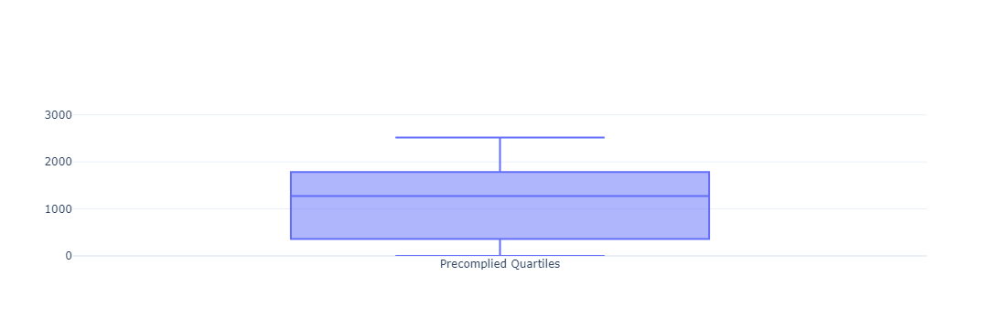

In [97]:
fig = make_subplots(rows=1,cols=1)

fig.add_trace(go.Box(y=df['Total_Revolving_Bal']
                     , name="Precomplied Quartiles"))

fig.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
fig.update_yaxes(range=[0,3500])

iplot(fig)

In [98]:
##HISTOGRAM OF Total_Revolving_Bal

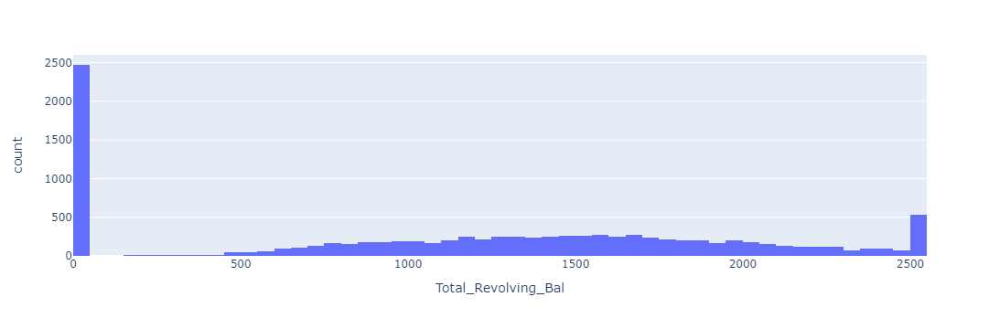

In [99]:
fig = px.histogram(df, x="Total_Revolving_Bal")
fig.show()

In [100]:
##HISTOGRAM OF Attrition_Flag & Total_Revolving_Bal

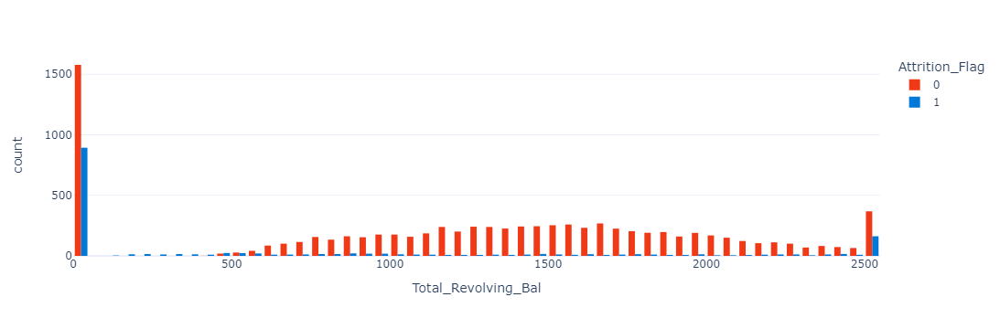

In [101]:
fig = px.histogram(df, x="Total_Revolving_Bal", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [102]:
##ANALYSIS OF Avg_Open_To_Buy

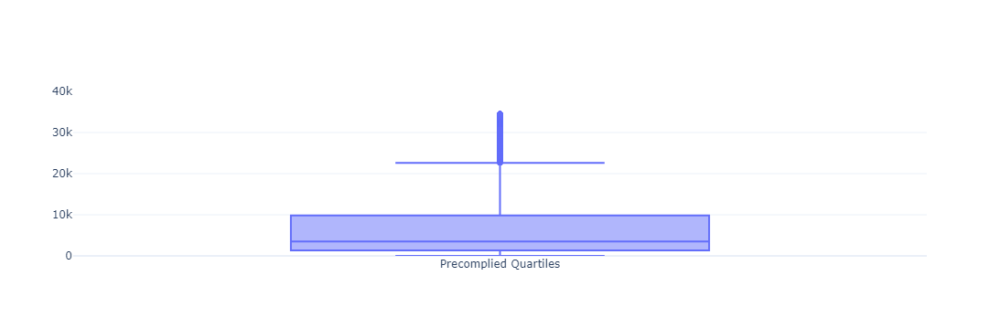

In [103]:
fig = make_subplots(rows=1,cols=1)

fig.add_trace(go.Box(y=df['Avg_Open_To_Buy']
                     , name="Precomplied Quartiles"))

fig.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
fig.update_yaxes(range=[0,40000])

iplot(fig)

In [104]:
##HISTOGRAM OF Avg_Open_To_Buy

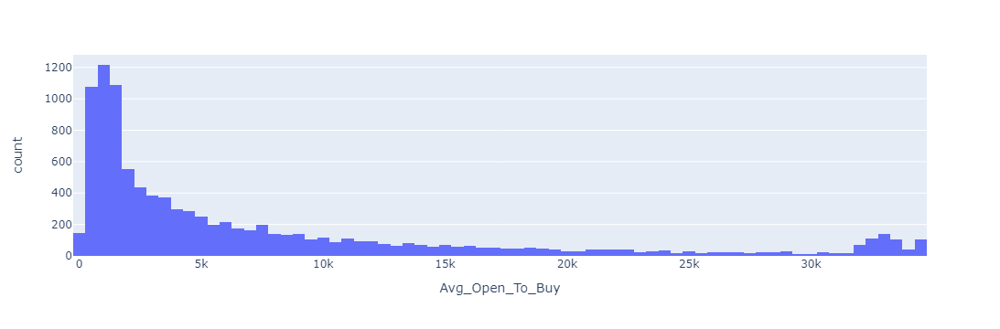

In [105]:
fig = px.histogram(df, x="Avg_Open_To_Buy")
fig.show()

In [106]:
##HISTOGRAM OF Attrition_Flag & Avg_Open_To_Buy

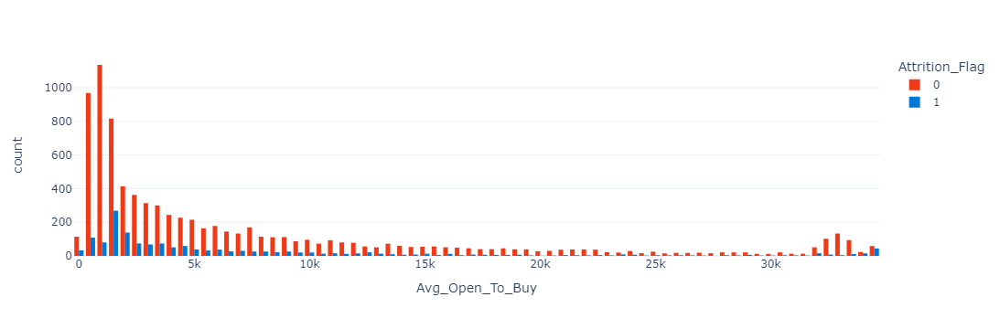

In [107]:
fig = px.histogram(df, x="Avg_Open_To_Buy", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [108]:
##ANALYSIS OF Total_Amt_Chng_Q4_Q1

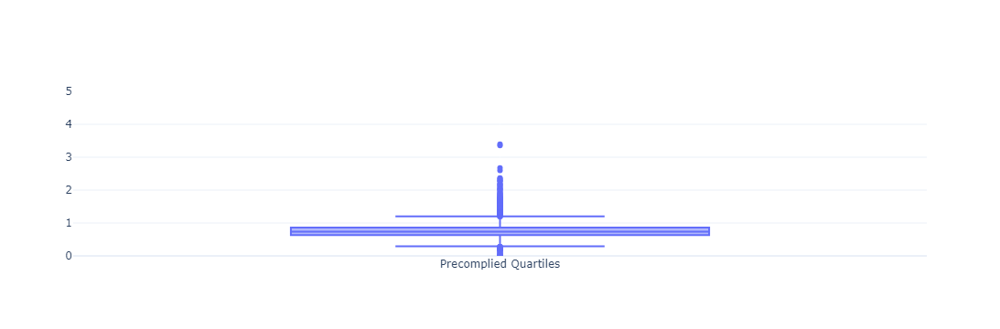

In [109]:
fig = make_subplots(rows=1,cols=1)

fig.add_trace(go.Box(y=df['Total_Amt_Chng_Q4_Q1']
                     , name="Precomplied Quartiles"))

fig.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
fig.update_yaxes(range=[0,5])

iplot(fig)

In [110]:
##HISTOGRAM OF Total_Amt_Chng_Q4_Q1

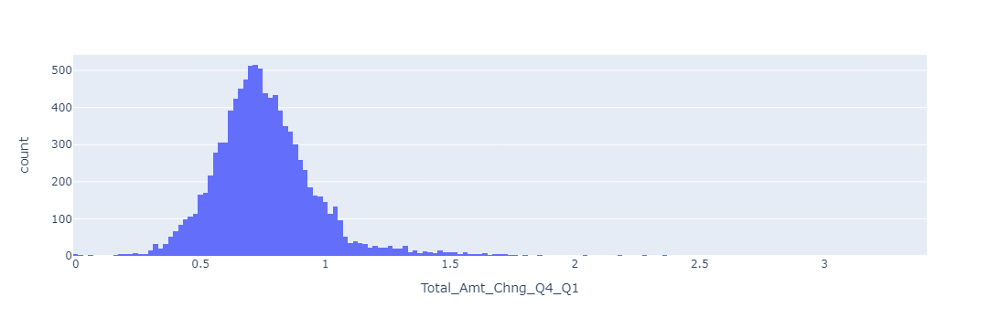

In [111]:
fig = px.histogram(df, x="Total_Amt_Chng_Q4_Q1")
fig.show()

In [112]:
##HISTOGRAM OF Attrition_Flag & Total_Amt_Chng_Q4_Q1

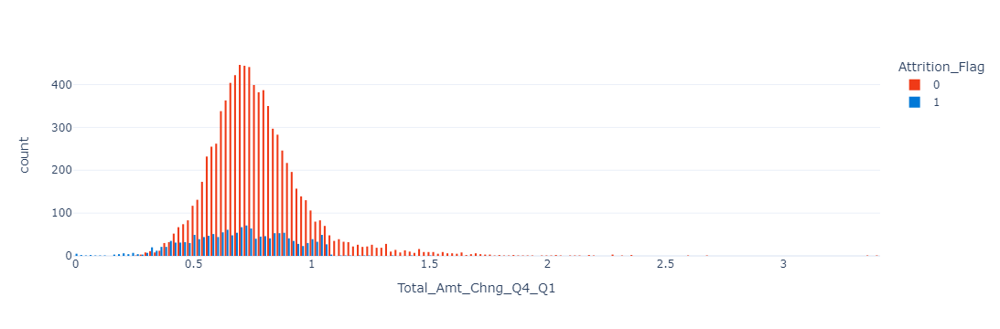

In [113]:
fig = px.histogram(df, x="Total_Amt_Chng_Q4_Q1", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [114]:
##ANALYSIS OF Total_Trans_Amt

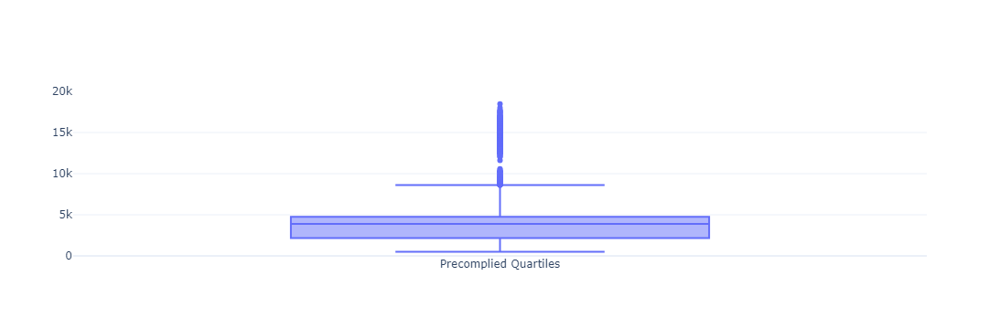

In [115]:
fig = make_subplots(rows=1,cols=1)

fig.add_trace(go.Box(y=df['Total_Trans_Amt']
                     , name="Precomplied Quartiles"))

fig.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
fig.update_yaxes(range=[0,20000])

iplot(fig)

In [116]:
##HISTOGRAM OF Total_Trans_Amt

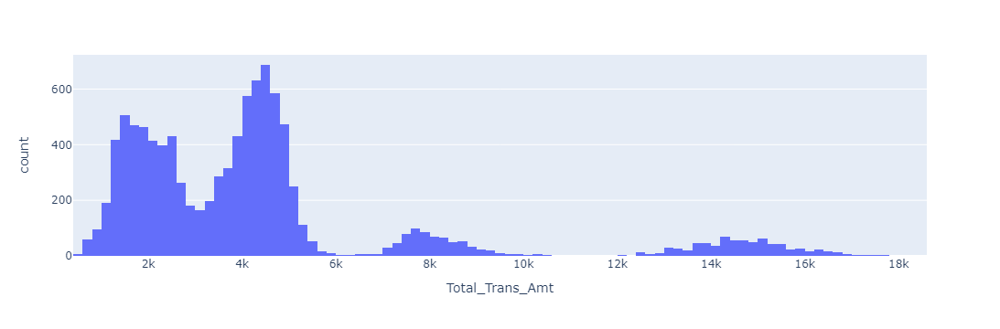

In [117]:
fig = px.histogram(df, x="Total_Trans_Amt")
fig.show()

In [118]:
##HISTOGRAM OF Attrition_Flag & Total_Trans_Amt

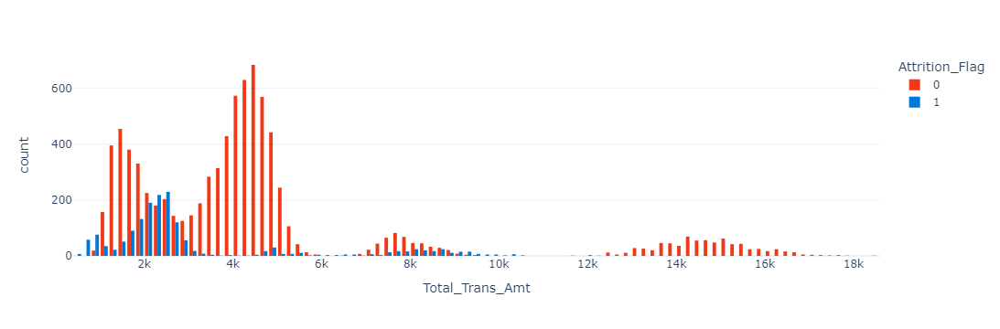

In [119]:
fig = px.histogram(df, x="Total_Trans_Amt", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [120]:
##ANALYSIS OF Total_Trans_Ct

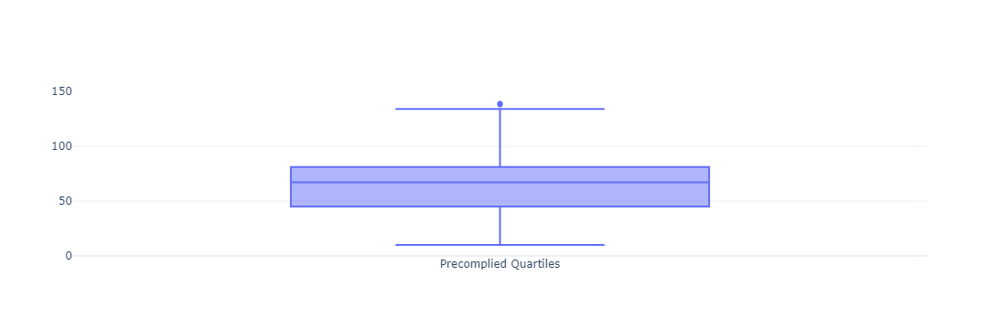

In [121]:
fig = make_subplots(rows=1,cols=1)

fig.add_trace(go.Box(y=df['Total_Trans_Ct']
                     , name="Precomplied Quartiles"))

fig.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
fig.update_yaxes(range=[0,150])

iplot(fig)

In [122]:
##HISTOGRAM OF Total_Trans_Ct

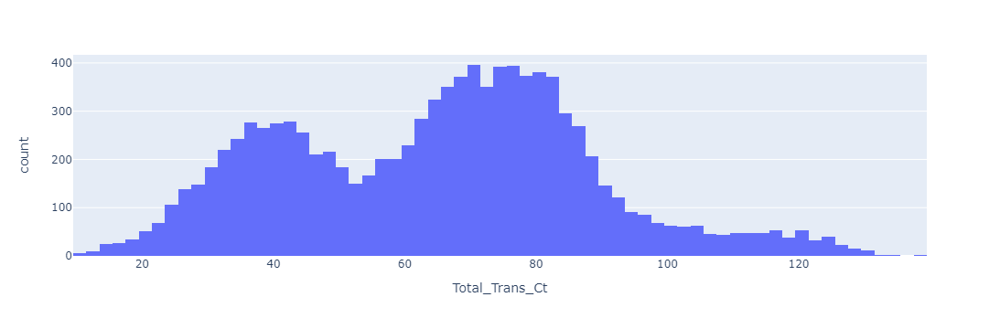

In [123]:
fig = px.histogram(df, x="Total_Trans_Ct")
fig.show()

In [124]:
##HISTOGRAM OF Attrition_Flag & Total_Trans_Ct

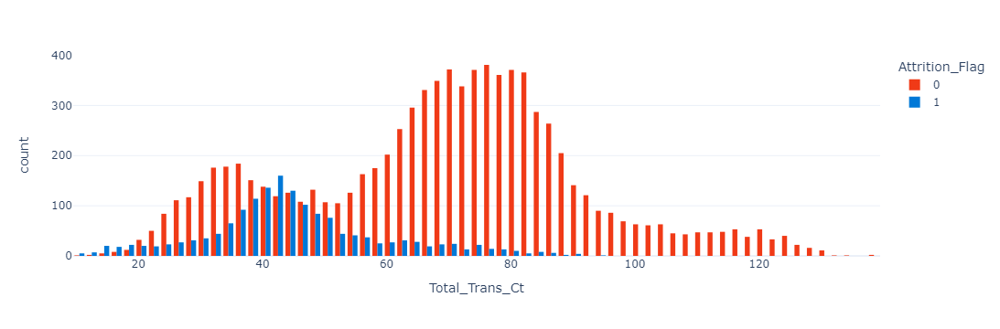

In [125]:
fig = px.histogram(df, x="Total_Trans_Ct", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [126]:
##ANALYSIS OF Total_Ct_Chng_Q4_Q1

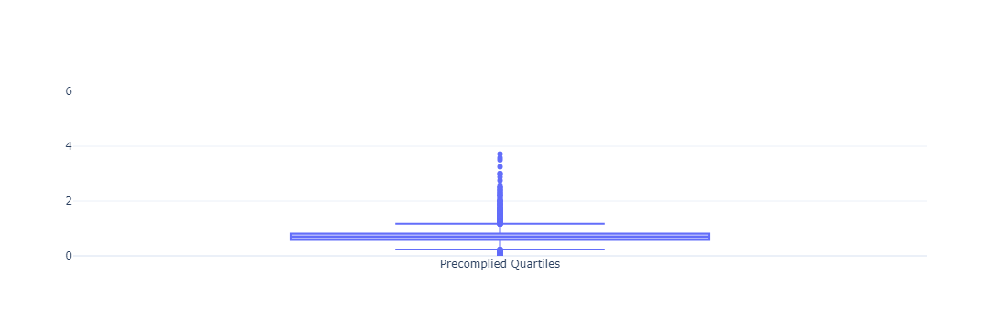

In [127]:
fig = make_subplots(rows=1,cols=1)

fig.add_trace(go.Box(y=df['Total_Ct_Chng_Q4_Q1']
                     , name="Precomplied Quartiles"))

fig.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
fig.update_yaxes(range=[0,6])

iplot(fig)

In [128]:
##HISTOGRAM OF Total_Ct_Chng_Q4_Q1

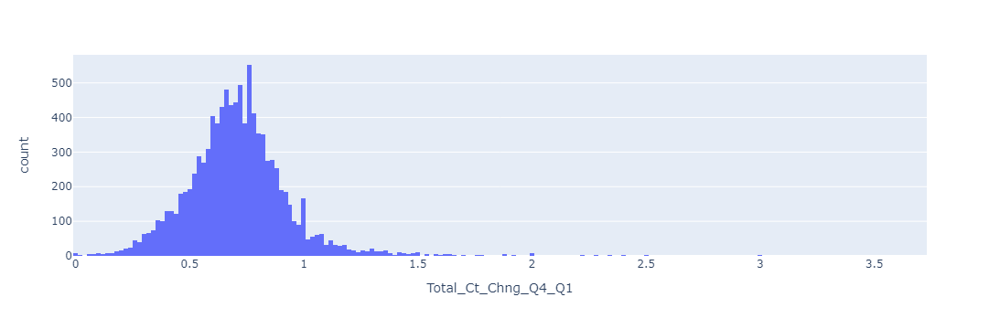

In [129]:
fig = px.histogram(df, x="Total_Ct_Chng_Q4_Q1")
fig.show()

In [130]:
##HISTOGRAM OF Attrition_Flag & Total_Ct_Chng_Q4_Q1

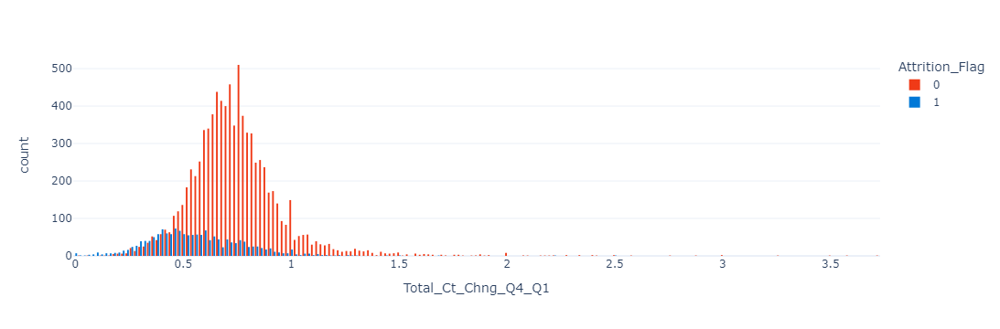

In [131]:
fig = px.histogram(df, x="Total_Ct_Chng_Q4_Q1", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [132]:
##ANALYSIS OF Avg_Utilization_Ratio

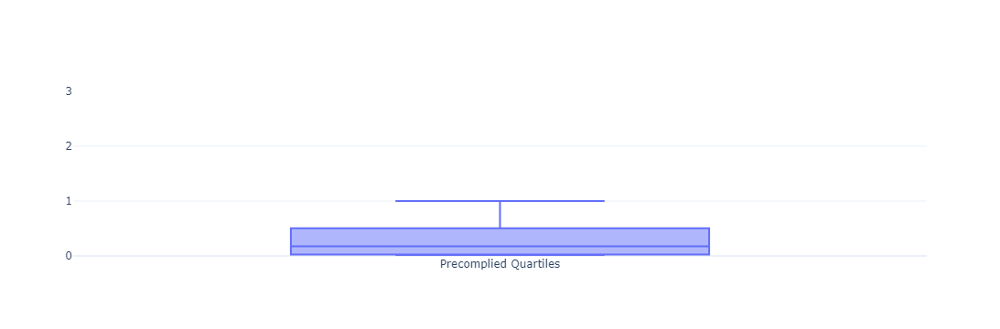

In [133]:
fig = make_subplots(rows=1,cols=1)

fig.add_trace(go.Box(y=df['Avg_Utilization_Ratio']
                     , name="Precomplied Quartiles"))

fig.update_layout(title={'y':0.9,
                         'x':0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')
fig.update_yaxes(range=[0,3])

iplot(fig)

In [134]:
##HISTOGRAM OF Avg_Utilization_Ratio

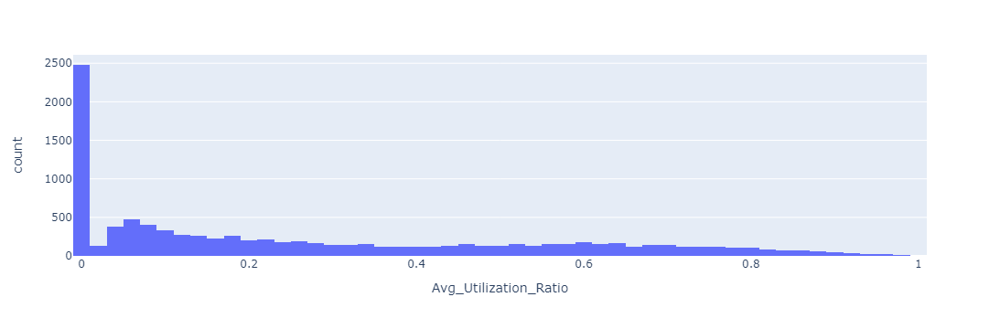

In [135]:
fig = px.histogram(df, x="Avg_Utilization_Ratio")
fig.show()

In [136]:
##HISTOGRAM OF Attrition_Flag & Avg_Utilization_Ratio

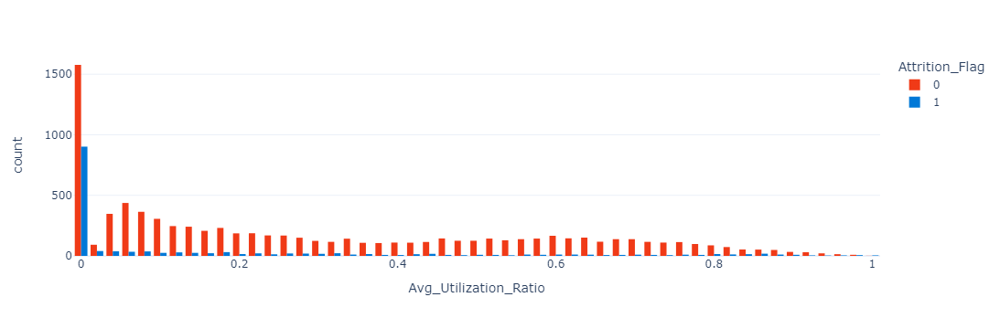

In [137]:
fig = px.histogram(df, x="Avg_Utilization_Ratio", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [138]:
###CATEGORICAL DATA###

In [139]:
###EDA & VISUALIZATION ON CATEGORICAL VARIABLES

In [140]:
##LIST OF CATEGORICAL VARIABLE

In [141]:
cat_features = [feature for feature in df.columns if df[feature].dtypes == 'object']

print('Number of categorical variables: ', len(cat_features))
print('\n')
print('Categorical Variables column name: ', cat_features)
print('\n')

df[cat_features].head()

Number of categorical variables:  5


Categorical Variables column name:  ['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']




,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
0,M,High School,Married,$60K - $80K,Blue
1,F,Graduate,Single,Less than $40K,Blue
2,M,Graduate,Married,$80K - $120K,Blue
3,F,High School,Unknown,Less than $40K,Blue
4,M,Uneducated,Married,$60K - $80K,Blue


In [142]:
##ANALYSIS OF Gender

In [143]:
df_nunique = {var: pd.DataFrame(df['Gender'].value_counts())
              for var in {'Gender'}}
print(df_nunique['Gender'])

        count
Gender       
F        5358
M        4769


In [144]:
##BAR GRAPH OF Gender

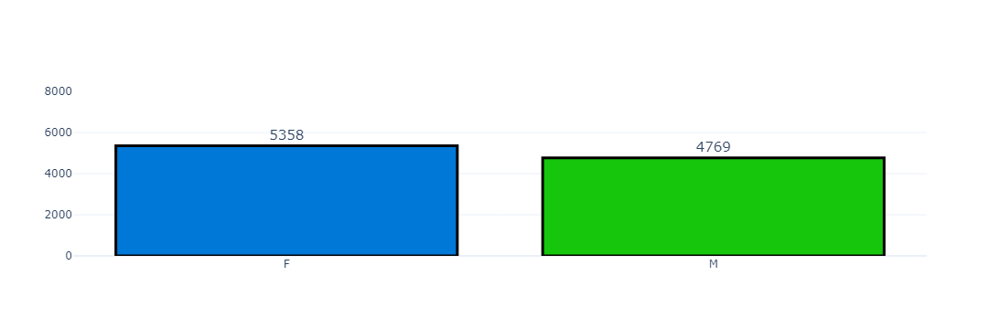

In [145]:
fig = make_subplots(rows=1, cols=1)
Colors = ['#0078d7', '#16c60c', '#f03a17', '#00f8d7', '#f0f87f']
fig.add_trace(go.Bar(y=df['Gender'].value_counts().values.tolist(),
                     x=df['Gender'].value_counts().index,
                     text=df['Gender'].value_counts().values.tolist(),
                     textfont=dict(size=15),
                     textposition='outside',
                     showlegend=False,
                     marker=dict(color=Colors,
                                 line_color='black',
                                 line_width=3)),
              row=1, col=1)

fig.update_layout(title={'y': 0.9,
                         'x': 0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')

fig.update_yaxes(range=[0, 8000])
iplot(fig)

In [146]:
##HISTOGRAM OF Attrition_Flag & Gender

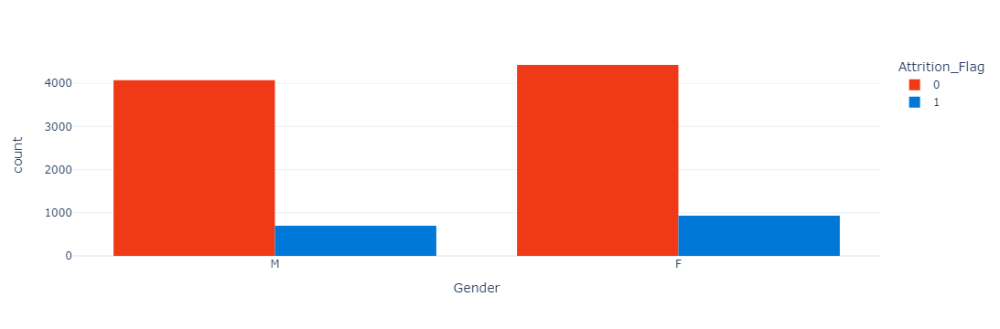

In [147]:
fig = px.histogram(df, x="Gender", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [148]:
##ANALYSIS OF Education_Level

In [149]:
df_nunique = {var: pd.DataFrame(df['Education_Level'].value_counts())
              for var in {'Education_Level'}}
print(df_nunique['Education_Level'])

                 count
Education_Level       
Graduate          3128
High School       2013
Unknown           1519
Uneducated        1487
College           1013
Post-Graduate      516
Doctorate          451


In [150]:
##BAR GRAPH OF Education_Level

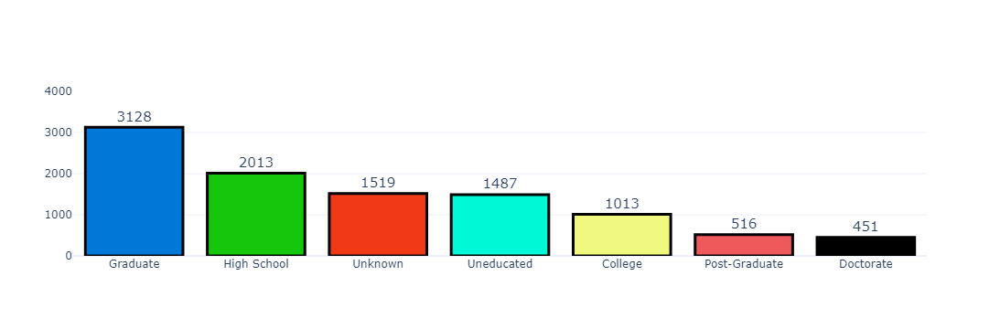

In [151]:
fig = make_subplots(rows=1, cols=1)
Colors = ['#0078d7', '#16c60c', '#f03a17', '#00f8d7', '#f0f87f', '#f0595c']
fig.add_trace(go.Bar(y=df['Education_Level'].value_counts().values.tolist(),
                     x=df['Education_Level'].value_counts().index,
                     text=df['Education_Level'].value_counts().values.tolist(),
                     textfont=dict(size=15),
                     textposition='outside',
                     showlegend=False,
                     marker=dict(color=Colors,
                                 line_color='black',
                                 line_width=3)),
              row=1, col=1)

fig.update_layout(title={'y': 0.9,
                         'x': 0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')

fig.update_yaxes(range=[0, 4000])
iplot(fig)

In [152]:
##HISTOGRAM OF Attrition_Flag & Education_Level

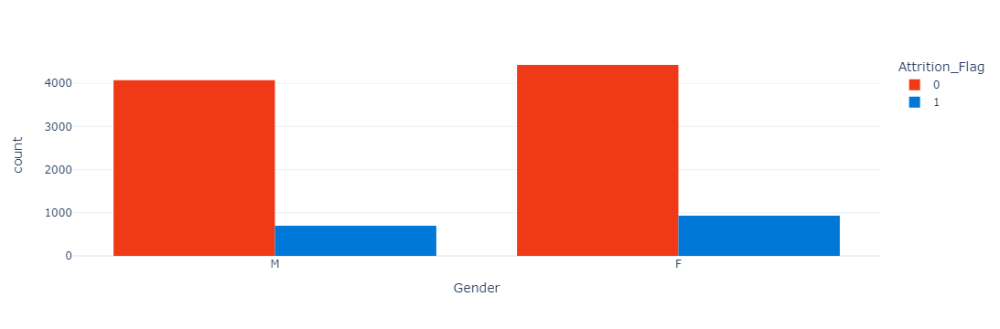

In [153]:
fig = px.histogram(df, x="Gender", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [154]:
##ANALYSIS OF Marital_Status

In [155]:
df_nunique = {var: pd.DataFrame(df['Marital_Status'].value_counts())
              for var in {'Marital_Status'}}
print(df_nunique['Marital_Status'])

                count
Marital_Status       
Married          4687
Single           3943
Unknown           749
Divorced          748


In [156]:
##BAR GRAPH OF Marital_Status

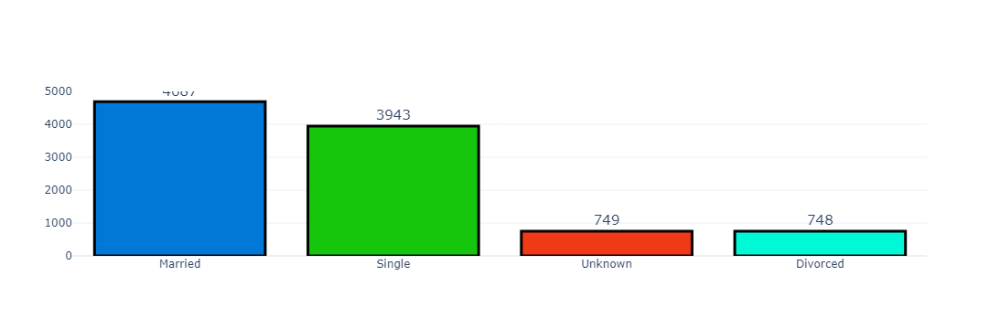

In [157]:
fig = make_subplots(rows=1, cols=1)
Colors = ['#0078d7', '#16c60c', '#f03a17', '#00f8d7', '#f0f87f', '#f0595c']
fig.add_trace(go.Bar(y=df['Marital_Status'].value_counts().values.tolist(),
                     x=df['Marital_Status'].value_counts().index,
                     text=df['Marital_Status'].value_counts().values.tolist(),
                     textfont=dict(size=15),
                     textposition='outside',
                     showlegend=False,
                     marker=dict(color=Colors,
                                 line_color='black',
                                 line_width=3)),
              row=1, col=1)

fig.update_layout(title={'y': 0.9,
                         'x': 0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')

fig.update_yaxes(range=[0, 5000])
iplot(fig)

In [158]:
##HISTOGRAM OF Attrition_Flag & Marital_Status

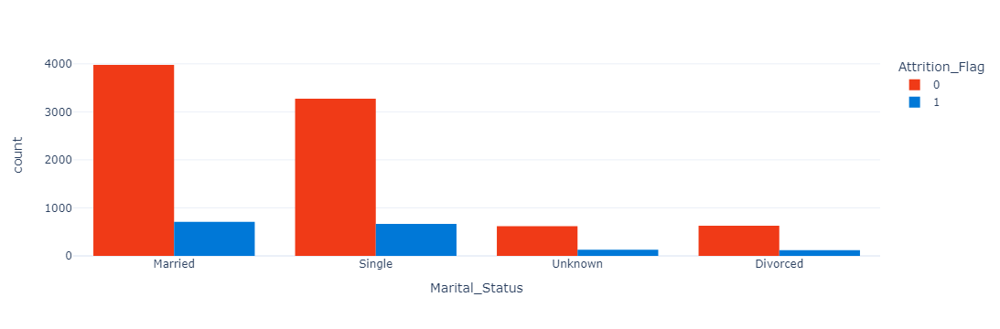

In [159]:
fig = px.histogram(df, x="Marital_Status", color="Attrition_Flag",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [160]:
##ANALYSIS OF Income_Category

In [161]:
df_nunique = {var: pd.DataFrame(df['Income_Category'].value_counts())
              for var in {'Income_Category'}}
print(df_nunique['Income_Category'])

                 count
Income_Category       
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727


In [162]:
##BAR GRAPH OF Income_Category

In [163]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [164]:
fig = make_subplots(rows=1, cols=1)
Colors = ['#0078d7', '#16c60c', '#f03a17', '#00f8d7', '#f0f87f', '#f0595c']
fig.add_trace(go.Bar(y=df['Income_Category'].value_counts().values.tolist(),
                     x=df['Income_Category'].value_counts().index,
                     text=df['Income_Category'].value_counts().values.tolist(),
                     textfont=dict(size=15),
                     textposition='outside',
                     showlegend=False,
                     marker=dict(color=Colors,
                                 line_color='black',
                                 line_width=3)), row=1, col=1)

fig.update_layout(title={'y': 0.9,
                         'x': 0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')

fig.update_yaxes(range=[0, 4000])
iplot(fig)


In [ ]:
##HISTOGRAM OF Attrition_Flag & Income_Category

In [170]:
fig = px.histogram(df, x="Income_Category", color="Income_Category",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [ ]:
##ANALYSIS OF Card_Category

In [165]:
df_nunique = {var: pd.DataFrame(df['Card_Category'].value_counts())
              for var in {'Card_Category'}}
print(df_nunique['Card_Category'])

               count
Card_Category       
Blue            9436
Silver           555
Gold             116
Platinum          20


In [ ]:
##BAR GRAPH OF Card_Category

In [171]:
fig = make_subplots(rows=1, cols=1)
Colors = ['#0078d7', '#16c60c', '#f03a17', '#00f8d7', '#f0f87f', '#f0595c']
fig.add_trace(go.Bar(y=df['Income_Category'].value_counts().values.tolist(),
                     x=df['Income_Category'].value_counts().index,
                     text=df['Income_Category'].value_counts().values.tolist(),
                     textfont=dict(size=15),
                     textposition='outside',
                     showlegend=False,
                     marker=dict(color=Colors,
                                 line_color='black',
                                 line_width=3)), row=1, col=1)

fig.update_layout(title={'y': 0.9,
                         'x': 0.5,
                         'xanchor': 'center',
                         'yanchor': 'top'},
                  template='plotly_white')

fig.update_yaxes(range=[0, 10000])
iplot(fig)


In [ ]:
##HISTOGRAM OF Attrition_Flag & Card_Category

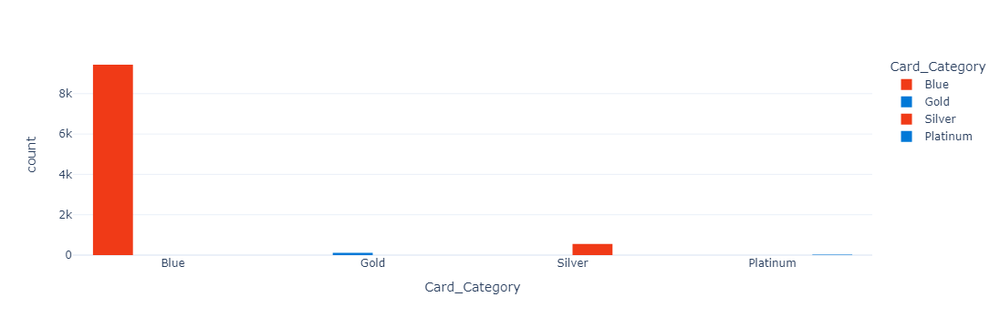

In [173]:
fig = px.histogram(df, x="Card_Category", color="Card_Category",
                   template='plotly_white', barmode='group', 
                   color_discrete_sequence={
                       0: "#f03a17", 
                       1: "#0078d7"})

fig.update_layout(bargap=0.2)

fig.show()

In [ ]:
###VISUALIZE THE COORELATION BETWEEN DEPENDENT AND INDEPENDENT FEATURES###

In [ ]:
##COORELATION METRIX USING PLOT HEAT MAP

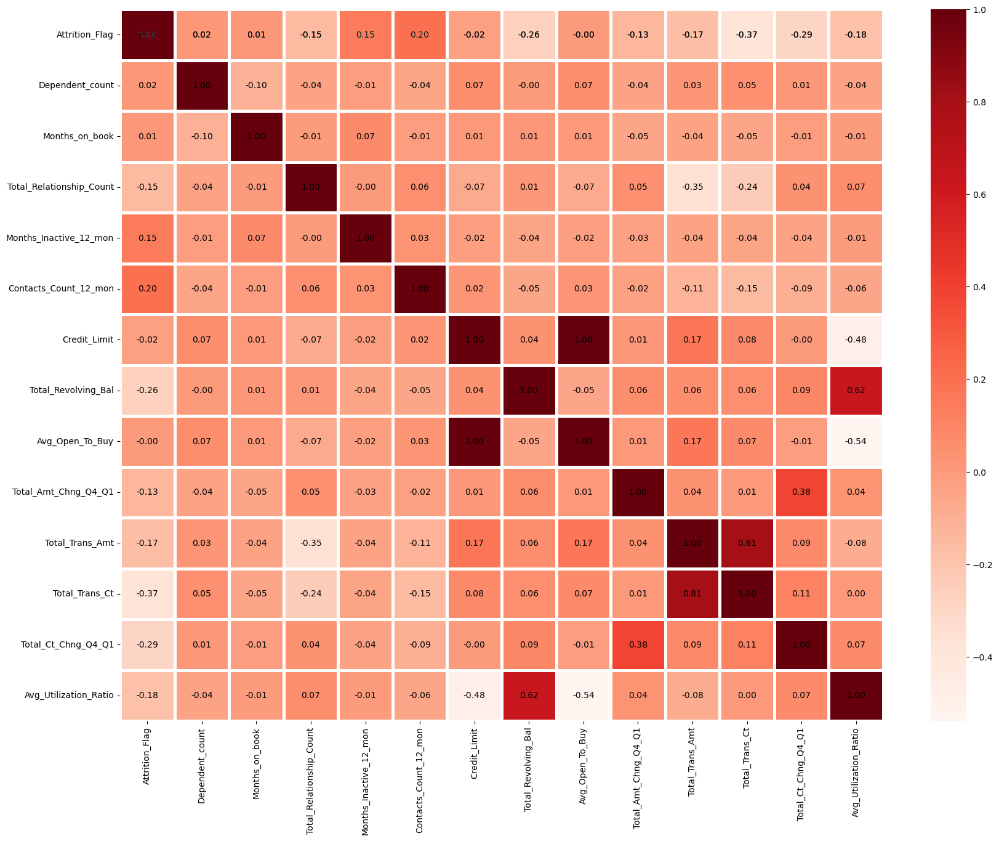

In [191]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_df = df.select_dtypes(include=['float64', 'int64'])

corrmat = numeric_df.corr()
top_corr_features = corrmat.index

plt.figure(figsize=(20,15))

def annotate_heatmap(data, **kwargs):
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            plt.text(j + 0.5, i + 0.5, '{:.2f}'.format(data.iloc[i, j]), ha='center', va='center')

sns.heatmap(numeric_df[top_corr_features].corr(), annot=True, cmap="Reds", linewidths=3.5, linecolor='white', fmt=".2f")
annotate_heatmap(numeric_df[top_corr_features].corr())
plt.show()


In [205]:
###ENCODING THE CATEGORICAL FEATURES###

In [ ]:
##ONE HOT ENCODING

In [206]:
df_new = pd.get_dummies(df, columns=['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category'], drop_first=True)
print(df_new.shape)


(10127, 34)


In [204]:
df_new.columns

Index(['Attrition_Flag', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio', 'Age',
       'Bank_Relationship_Period', 'Gender_M', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Education_Level_Unknown', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Unknown',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Income_Category_Unknown', 'Card_Category_Gold',
       'Card_Category_Platinum', 'Card_Category_Silver'],
      dtype='object')

In [209]:
df_new.head(2) #Eg

,Attrition_Flag,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Age,Bank_Relationship_Period,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,0,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1,3,True,False,False,True,False,False,False,True,False,False,False,True,False,False,False,False,False,False
1,0,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,2,4,False,False,True,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False


In [ ]:
##REARRANGEMENTS OF ALL THE COLUMNS

In [214]:
df = df_new[['Attrition_Flag', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio', 'Age',
       'Bank_Relationship_Period', 'Gender_M', 'Education_Level_Doctorate',
       'Education_Level_Graduate', 'Education_Level_High School',
       'Education_Level_Post-Graduate', 'Education_Level_Uneducated',
       'Education_Level_Unknown', 'Marital_Status_Married',
       'Marital_Status_Single', 'Marital_Status_Unknown',
       'Income_Category_$40K - $60K', 'Income_Category_$60K - $80K',
       'Income_Category_$80K - $120K', 'Income_Category_Less than $40K',
       'Income_Category_Unknown', 'Card_Category_Gold',
       'Card_Category_Platinum', 'Card_Category_Silver']]
df.head(3)

,Attrition_Flag,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Age,Bank_Relationship_Period,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,0,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,1,3,True,False,False,True,False,False,False,True,False,False,False,True,False,False,False,False,False,False
1,0,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,2,4,False,False,True,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False
2,0,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,2,3,True,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False


In [ ]:
###SCALING THE DATASET###

In [ ]:
##FORMLUA: x = (x - xmin)/(xmax - xmin)

In [216]:
from sklearn.preprocessing 
import MinMaxScaler

scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df.drop('Attrition_Flag', axis=1))


In [218]:
scaled_features = pd.DataFrame(scaled_data, columns=df.columns[:-1])
scaled_features.head()


,Attrition_Flag,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Age,Bank_Relationship_Period,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum
0,0.6,0.604651,0.8,0.166667,0.500000,0.340190,0.308701,0.345116,0.392994,0.035273,0.248062,0.437534,0.061061,0.25,0.666667,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.720930,1.0,0.166667,0.333333,0.206112,0.343266,0.214093,0.453636,0.043452,0.178295,1.000000,0.105105,0.50,1.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.6,0.534884,0.6,0.166667,0.000000,0.059850,0.000000,0.098948,0.763615,0.076611,0.077519,0.628164,0.000000,0.50,0.666667,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.8,0.488372,0.4,0.666667,0.166667,0.056676,1.000000,0.022977,0.413600,0.036775,0.077519,0.628164,0.760761,0.25,0.666667,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.6,0.186047,0.8,0.166667,0.000000,0.099091,0.000000,0.136557,0.640271,0.017025,0.139535,0.673129,0.000000,0.25,0.333333,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
###SPLIT THE FEATURES INTO TRAINING & TESTING DATASET###

In [220]:
x = scaled_features #Independent_Feature
y = df['Attrition_Flag'] #Dependent_Feature

In [224]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=0)

In [ ]:
###VISUALIZE MODEL SCORE###

In [235]:
##CROSS VALIDATION ON DIFFERENT SET OF ALGORITHM

In [ ]:
##CLASSFIER MODEL USED TO CLASSIFY THE DATASET

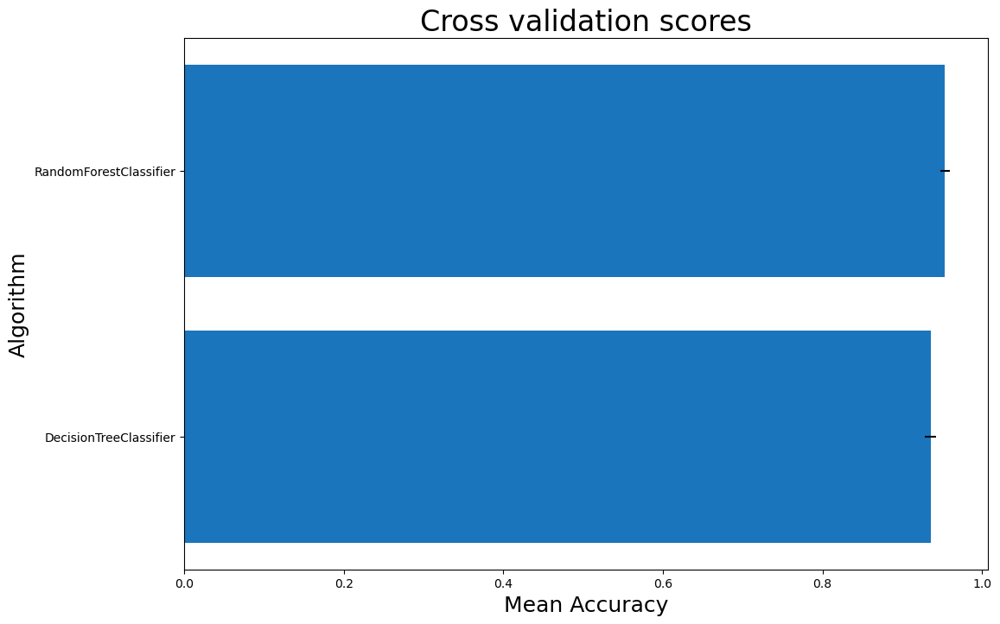

   CrossVal_Score_Means  CrossValerrors                    Algo
0              0.953584        0.005877  RandomForestClassifier
1              0.935525        0.007259  DecisionTreeClassifier


In [234]:
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have defined X_train and y_train previously
kfold = StratifiedKFold(n_splits=8, shuffle=True, random_state=42)

rs = 15
clrs = []

clrs.append(RandomForestClassifier(random_state=rs))
clrs.append(DecisionTreeClassifier(random_state=rs))

cv_results = []
for clr in clrs:
    cv_results.append(cross_val_score(clr, x_train, y_train, scoring='accuracy', cv=kfold, n_jobs=-1))

cv_means = []
cv_std = []
for cv_result in cv_results:
    cv_means.append(cv_result.mean())
    cv_std.append(np.std(cv_result))

cv_df = pd.DataFrame({"CrossVal_Score_Means": cv_means, "CrossValerrors": cv_std, "Algo": ["RandomForestClassifier", "DecisionTreeClassifier"]})

plt.figure(figsize=(12, 8))
g = sns.barplot(x="CrossVal_Score_Means", y="Algo", data=cv_df, orient="h", color='#0078d7', **{'xerr': cv_std})
g.set_xlabel("Mean Accuracy", fontsize=18)
g.set_ylabel("Algorithm", fontsize=18)
plt.title("Cross validation scores", fontsize=24)
plt.show()


print(cv_df)
